## Import the Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report, confusion_matrix
import warnings
import pickle
from scipy import stats
warnings.filterwarnings('ignore')
plt.style.use('fivethirtyeight')

## Read the dataset

In [ ]:
df = pd.read_csv("/content/insurance_claims.csv")
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [ ]:
print(df.shape)

(1000, 40)


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [ ]:
print(df.head())

   months_as_customer  age  policy_number policy_bind_date policy_state  \
0                 328   48         521585       2014-10-17           OH   
1                 228   42         342868       2006-06-27           IN   
2                 134   29         687698       2000-09-06           OH   
3                 256   41         227811       1990-05-25           IL   
4                 228   44         367455       2014-06-06           IL   

  policy_csl  policy_deductable  policy_annual_premium  umbrella_limit  \
0    250/500               1000                1406.91               0   
1    250/500               2000                1197.22         5000000   
2    100/300               2000                1413.14         5000000   
3    250/500               2000                1415.74         6000000   
4   500/1000               1000                1583.91         6000000   

   insured_zip  ... police_report_available total_claim_amount injury_claim  \
0       466132  ...      

## Handle Missing Values

In [ ]:
print(df.isna().sum())

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted            91
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

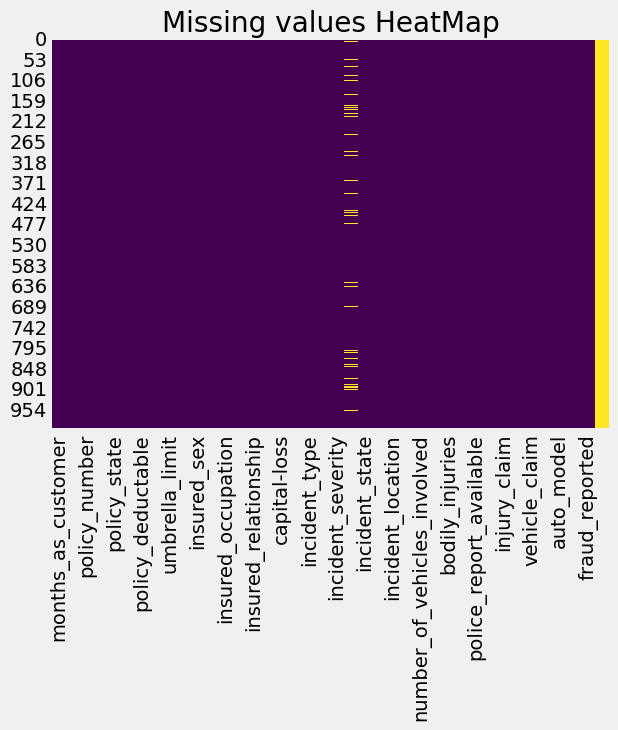

In [ ]:
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title("Missing values HeatMap")
plt.show()

In [ ]:
# As all the 1000 values of _c39 is NULL, we drop that column
df.drop(columns=['_c39'], inplace=True)

# We fill the 91 missing values with MODE (most frequent value)
df['authorities_contacted'].fillna(df['authorities_contacted'].mode()[0], inplace=True)

# Final check for missing values
print("\nMissing values after cleaning:\n", df.isnull().sum()[df.isnull().sum() > 0])


Missing values after cleaning:
 Series([], dtype: int64)


In [ ]:
# Check for duplicate rows
duplicate_rows = df[df.duplicated()]
print(f"Number of duplicate rows: {duplicate_rows.shape[0]}")

Number of duplicate rows: 0


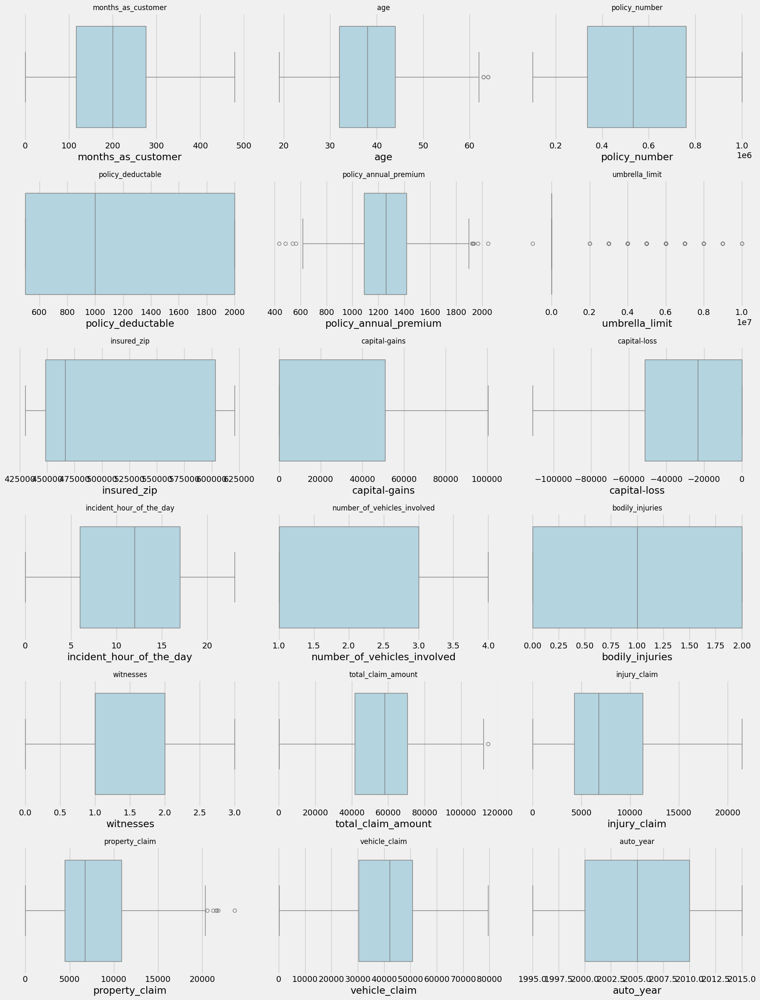

In [ ]:
numeric_cols = [
    'months_as_customer', 'age', 'policy_number', 'policy_deductable',
    'policy_annual_premium', 'umbrella_limit', 'insured_zip',
    'capital-gains', 'capital-loss', 'incident_hour_of_the_day',
    'number_of_vehicles_involved', 'bodily_injuries', 'witnesses',
    'total_claim_amount', 'injury_claim', 'property_claim',
    'vehicle_claim', 'auto_year'
]

# Set grid size
n_cols = 3
n_rows = (len(numeric_cols) + n_cols - 1) // n_cols

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 4))
axes = axes.flatten()

# Plot each boxplot in a subplot
for idx, col in enumerate(numeric_cols):
    sns.boxplot(x=df[col], ax=axes[idx], color='lightblue')
    axes[idx].set_title(f'{col}', fontsize=12)

# Hide any unused subplots
for i in range(len(numeric_cols), len(axes)):
    fig.delaxes(axes[i])

# Adjust layout
plt.tight_layout()
plt.show()


# High outliers are clearly visible in:
##### policy_annual_premium,
##### umbrella_limit,
##### capital-gains,
##### total_claim_amount,
##### injury_claim,
##### property_claim,
##### vehicle_claim



# **EDA**

In [ ]:
df.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


In [ ]:
print(df.nunique())

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             4
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

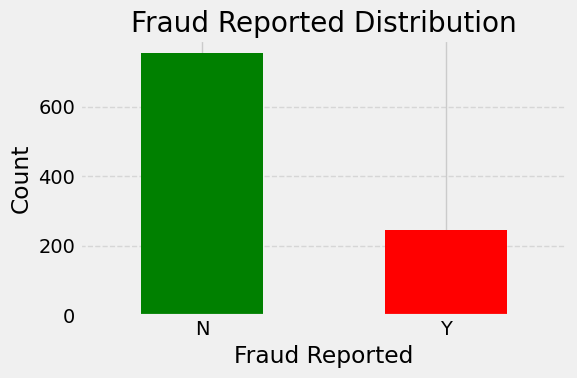

In [ ]:
fraud_counts = df['fraud_reported'].value_counts()

# Plot
plt.figure(figsize=(6, 4))
fraud_counts.plot(kind='bar', color=['green', 'red'])
plt.title('Fraud Reported Distribution')
plt.xlabel('Fraud Reported')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

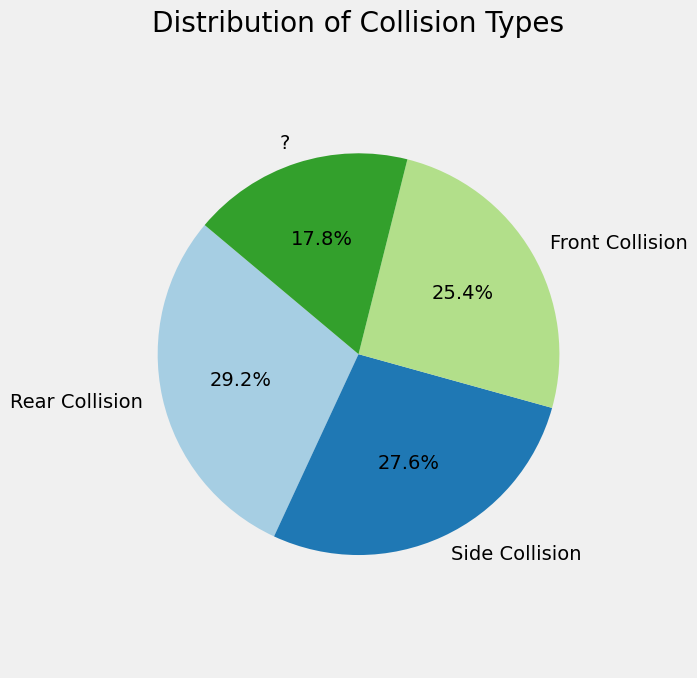

In [ ]:
collision_counts = df['collision_type'].value_counts()

# Plot pie chart
plt.figure(figsize=(7, 7))
plt.pie(
    collision_counts,
    labels=collision_counts.index,
    autopct='%1.1f%%',
    startangle=140,
    colors=plt.cm.Paired.colors
)
plt.title('Distribution of Collision Types')
plt.axis('equal')  # Equal aspect ratio ensures the pie is circular
plt.tight_layout()
plt.show()

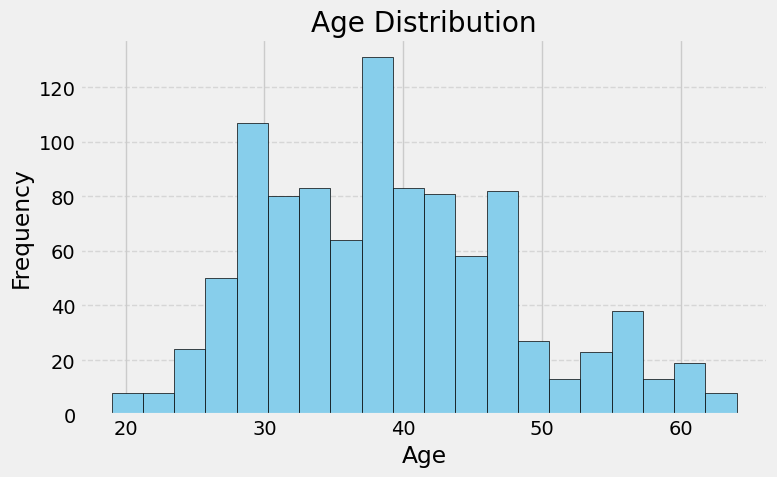

In [ ]:
plt.figure(figsize=(8, 5))
plt.hist(df['age'], bins=20, color='skyblue', edgecolor='black')
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


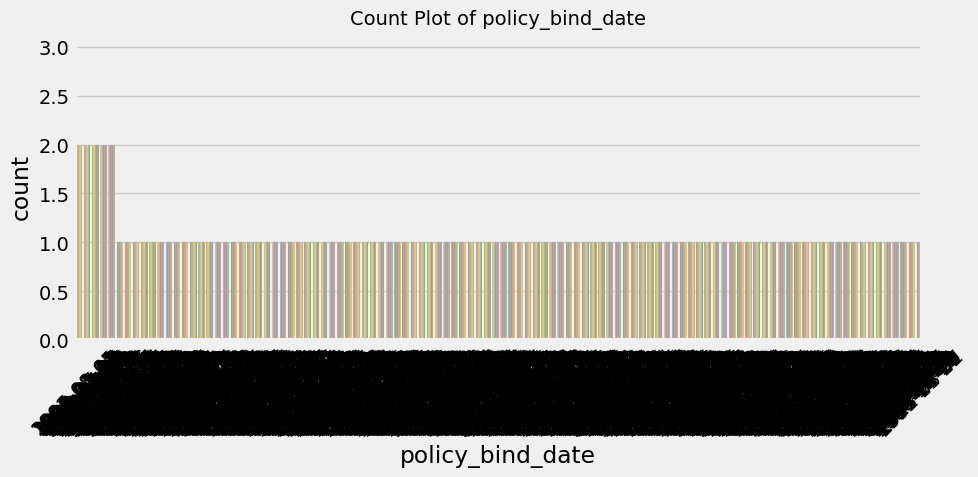

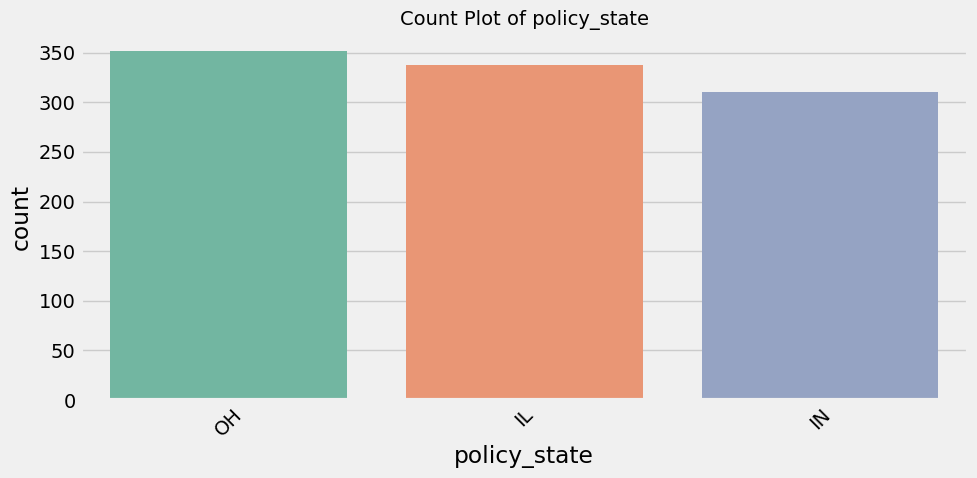

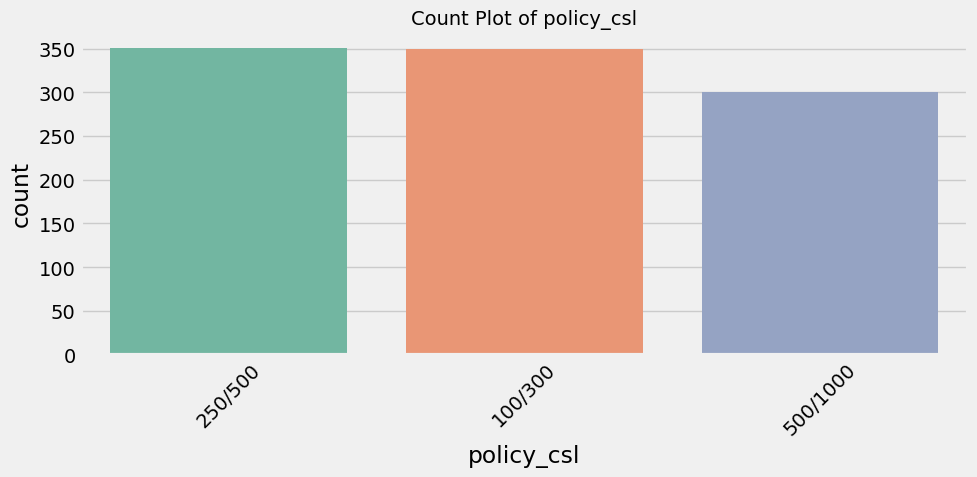

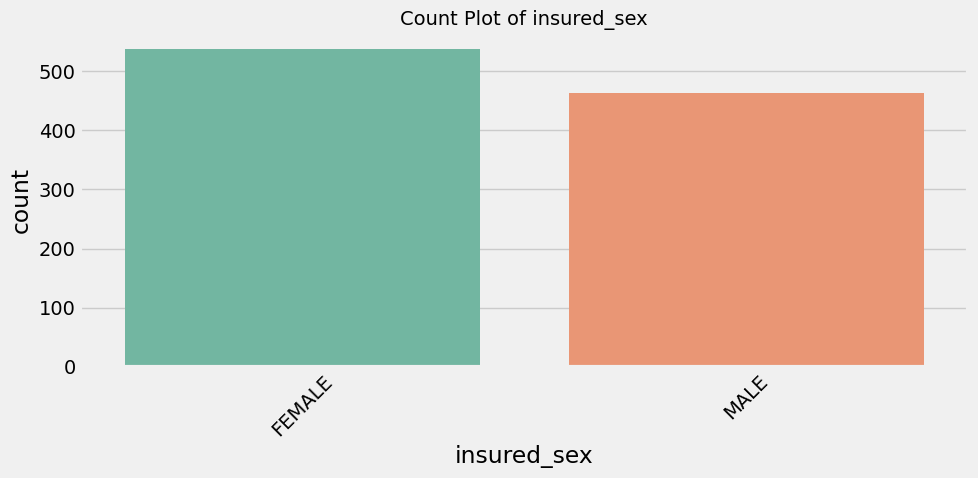

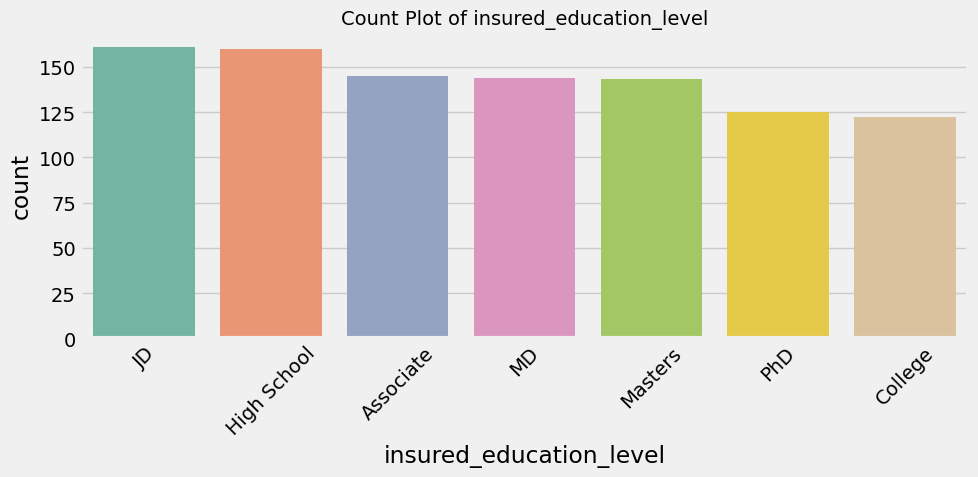

...

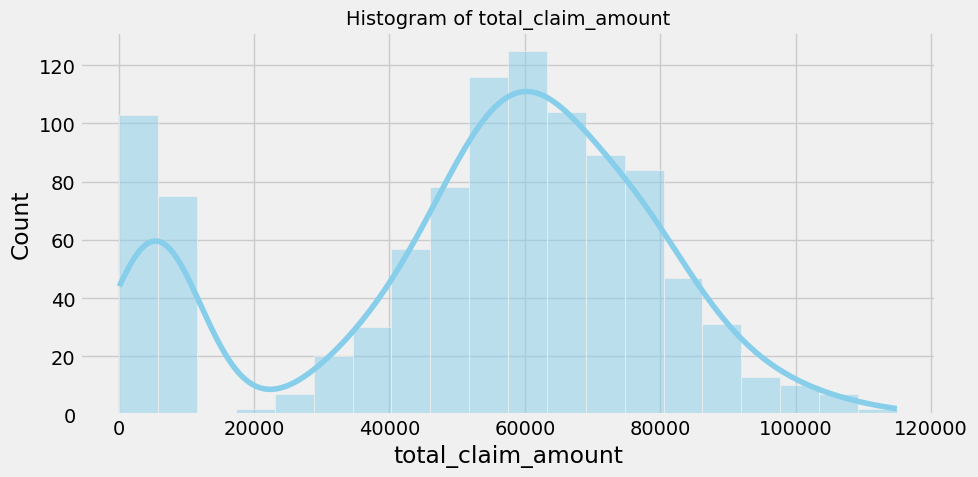

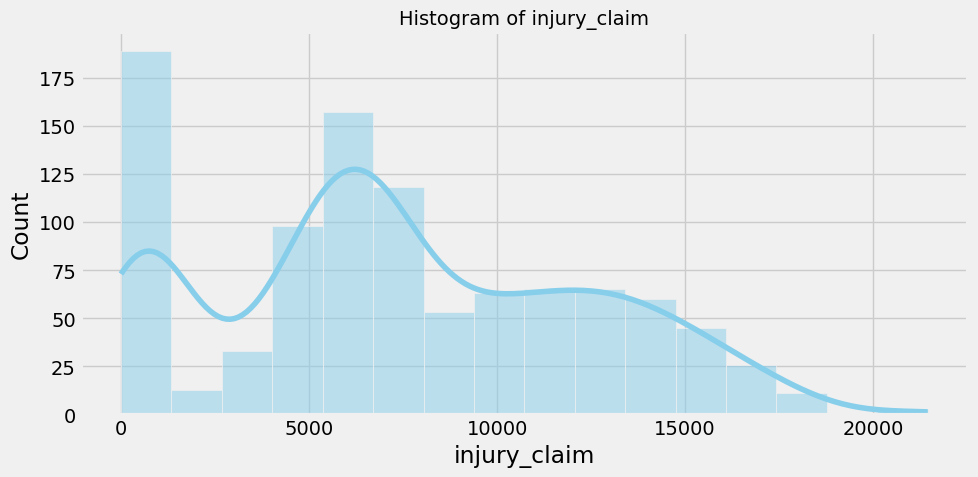

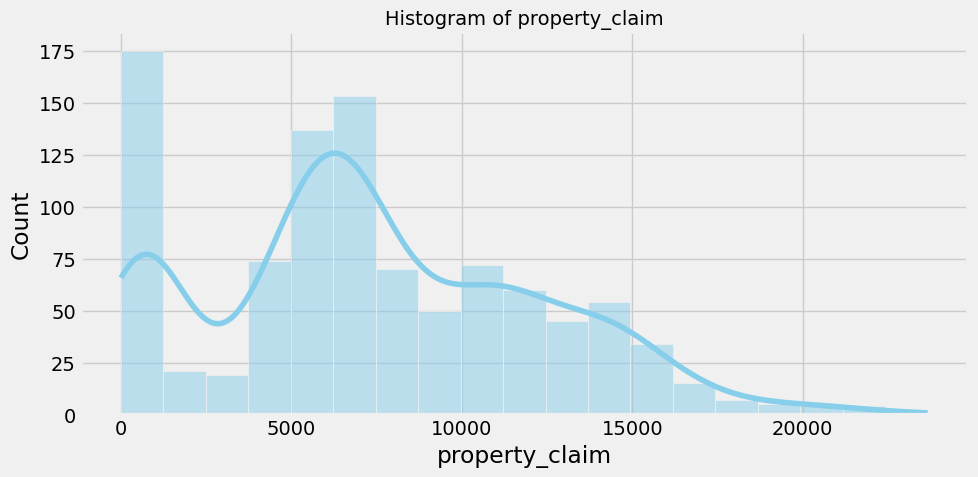

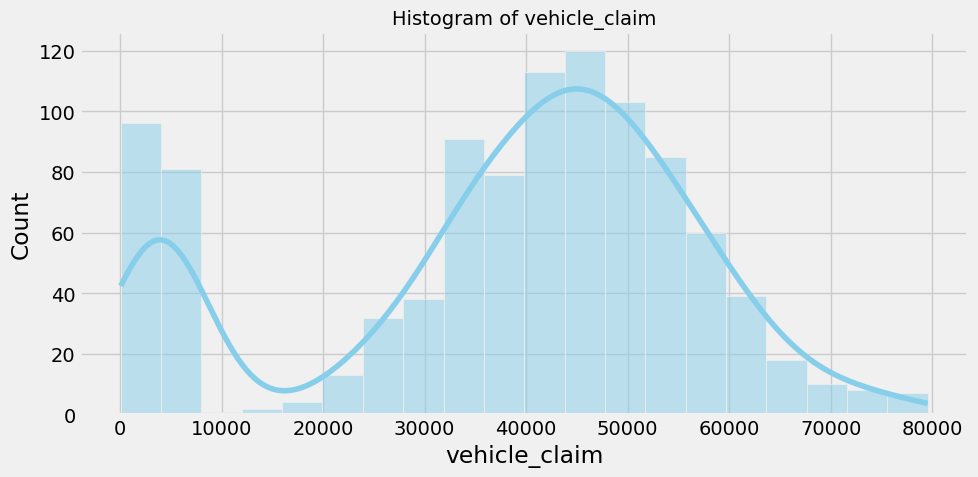

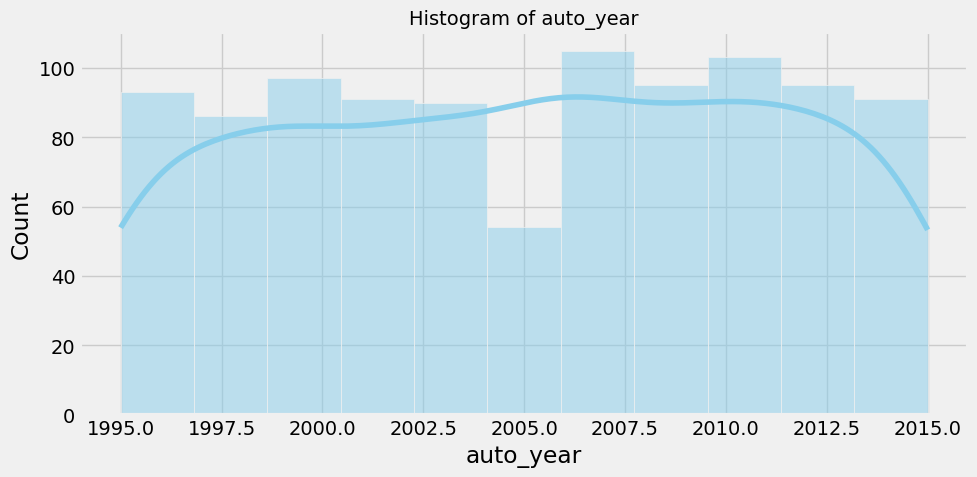

In [ ]:
target = 'fraud_reported'

categorical_cols = df.select_dtypes(include='object').columns.tolist()
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Remove target from feature list if present
if target in categorical_cols:
    categorical_cols.remove(target)
if target in numerical_cols:
    numerical_cols.remove(target)

# Univariate Analysis - Categorical columns
for col in categorical_cols:
    plt.figure(figsize=(10, 5))
    sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette='Set2')
    plt.title(f'Count Plot of {col}', fontsize=14)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Univariate Analysis - Numerical columns
for col in numerical_cols:
    plt.figure(figsize=(10, 5))
    sns.histplot(df[col], kde=True, color='skyblue')
    plt.title(f'Histogram of {col}', fontsize=14)
    plt.tight_layout()
    plt.show()

# **BIVARIATE ANALYSIS**

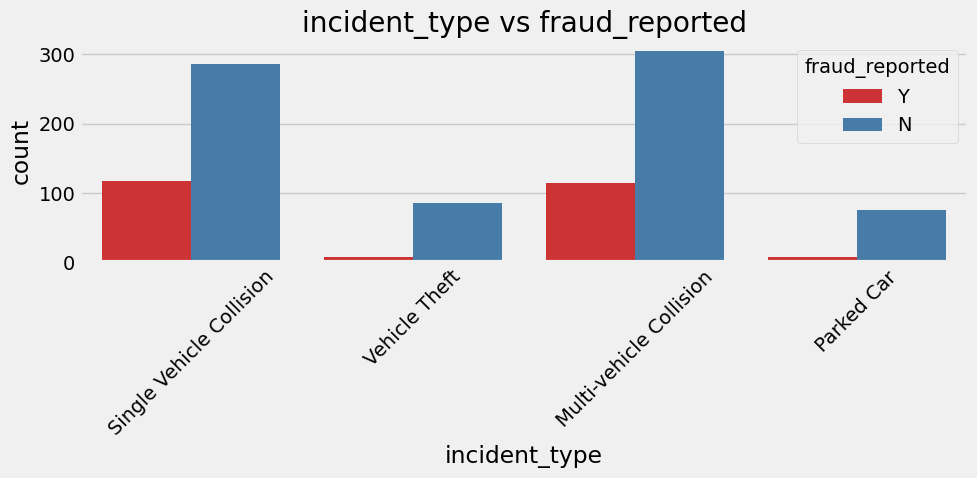

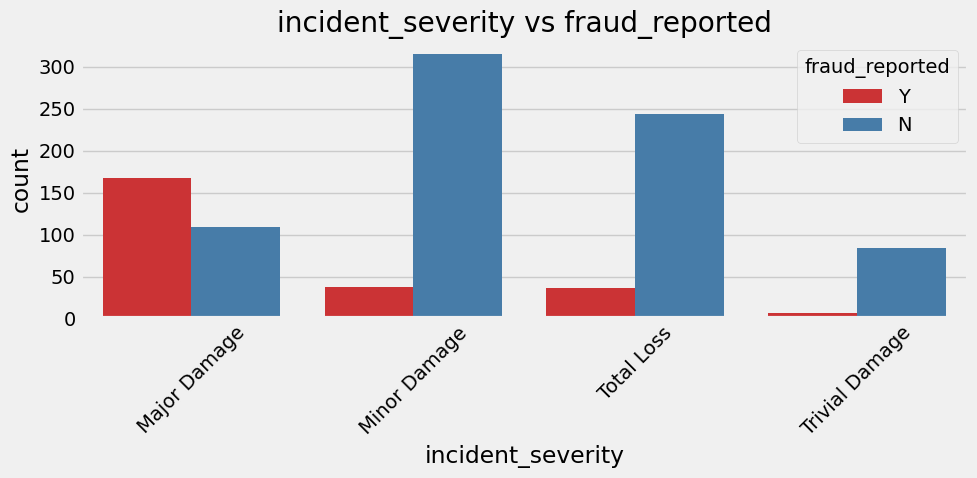

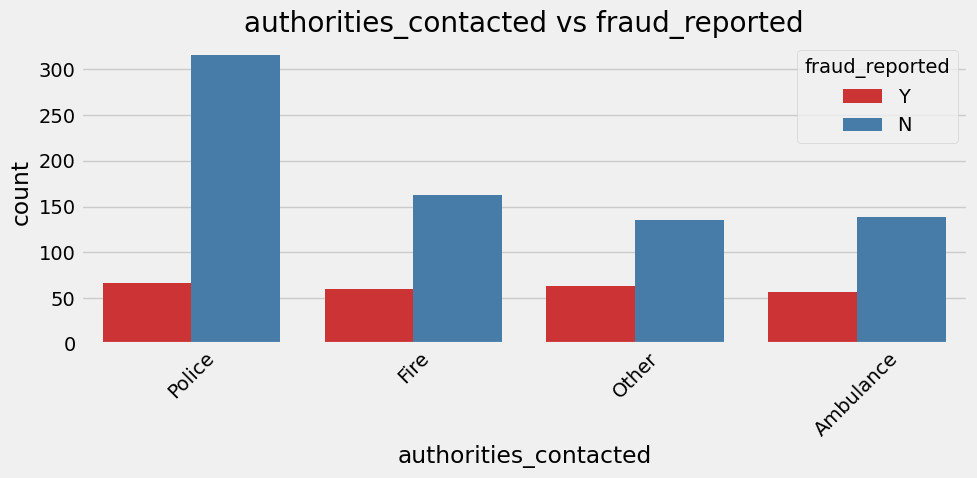

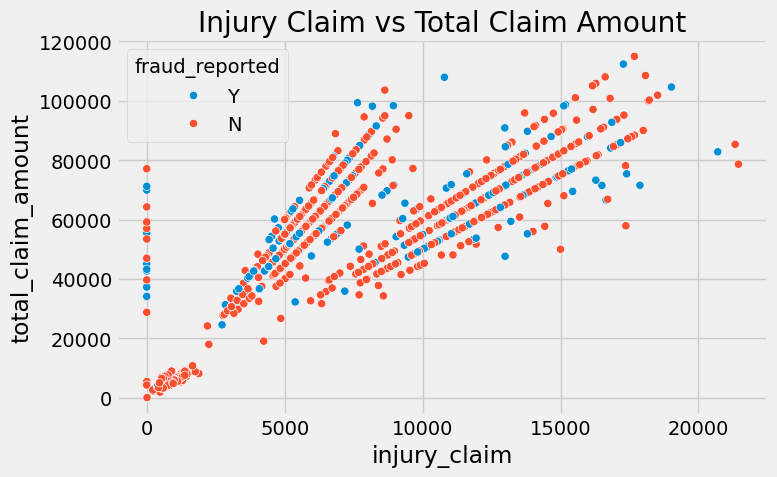

In [ ]:
# 1. Numerical vs Target (Boxplots)
important_numerical = ['total_claim_amount', 'policy_annual_premium', 'injury_claim']
# 2. Categorical vs Target (Countplots)
important_categorical = ['incident_type', 'incident_severity', 'authorities_contacted']
target = 'fraud_reported'

for col in important_categorical:
    plt.figure(figsize=(10, 5))
    sns.countplot(data=df, x=col, hue=target, palette='Set1')
    plt.title(f'{col} vs {target}')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# 3. Numerical vs Numerical (Scatter plot)
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x='injury_claim', y='total_claim_amount', hue=target)
plt.title('Injury Claim vs Total Claim Amount')
plt.tight_layout()
plt.show()

# **MULTIVARIATE ANALYSIS**

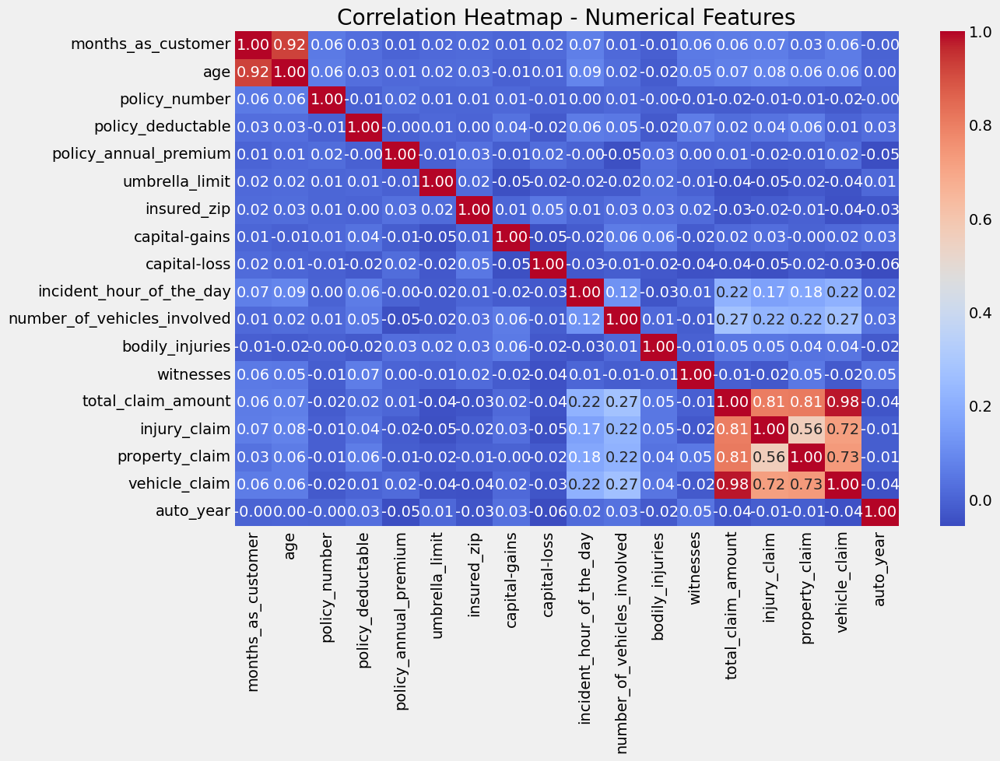

In [ ]:
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_cols = df.select_dtypes(include='object').columns.tolist()
target = 'fraud_reported'

# 1. Correlation Heatmap (Numerical Columns)
plt.figure(figsize=(14, 10))
sns.heatmap(df[numerical_cols].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap - Numerical Features")
plt.tight_layout()
plt.show()

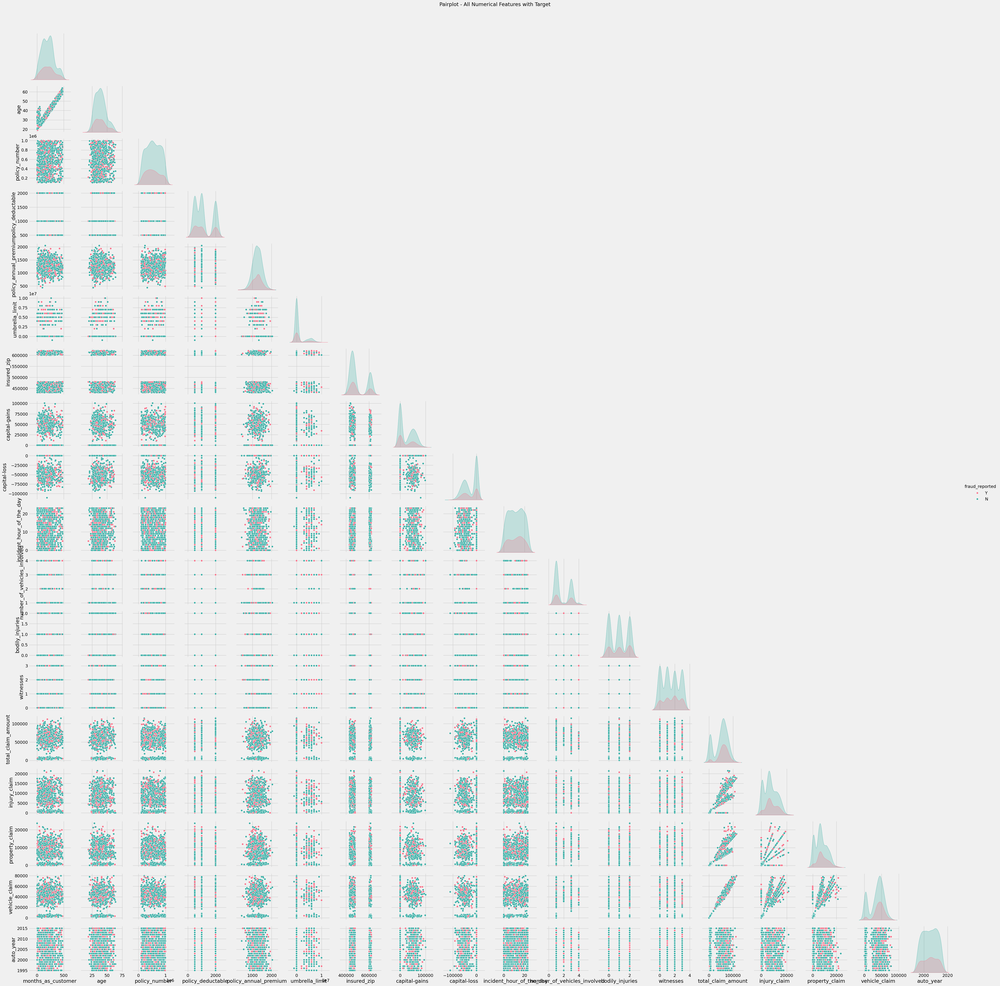

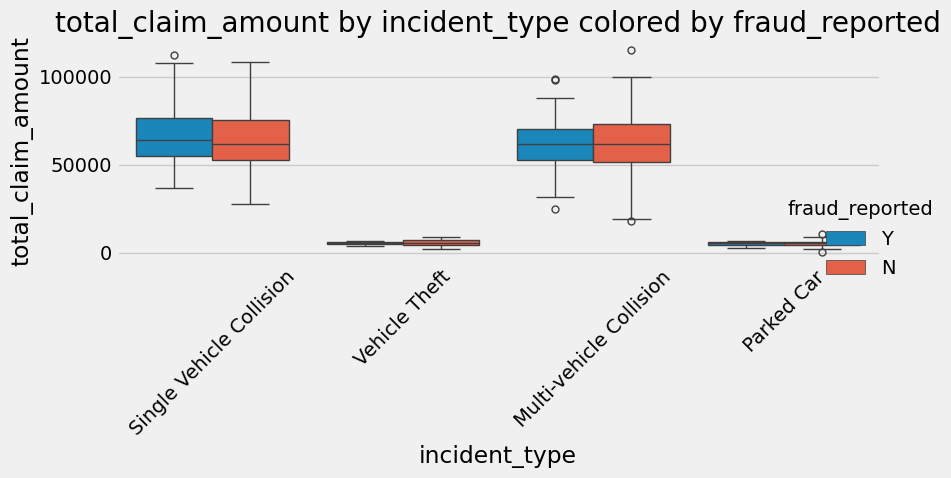

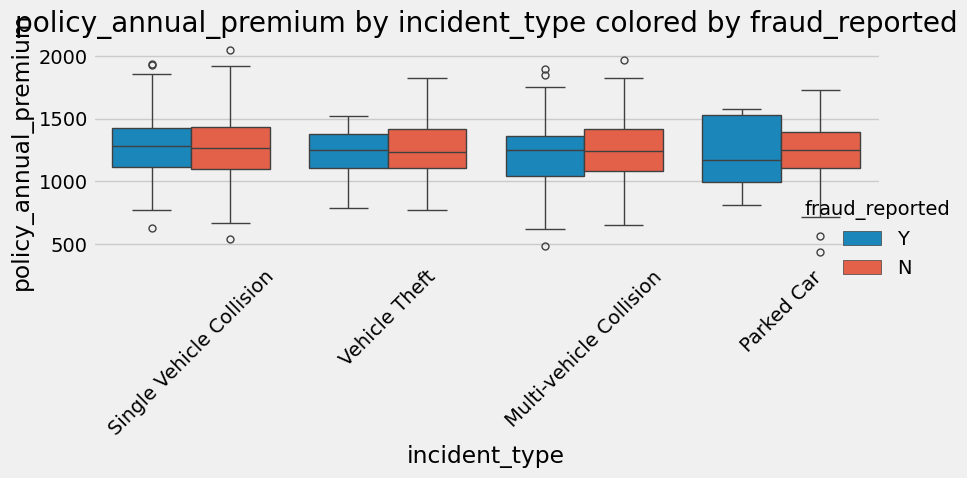

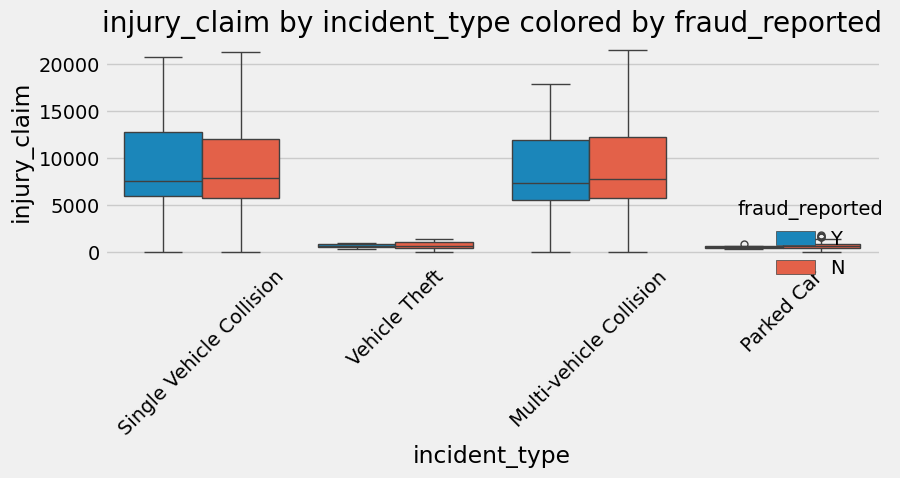

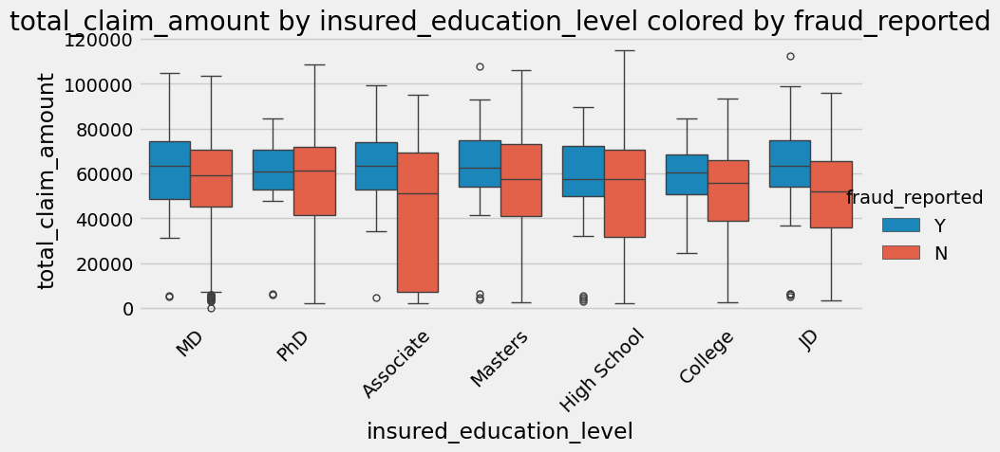

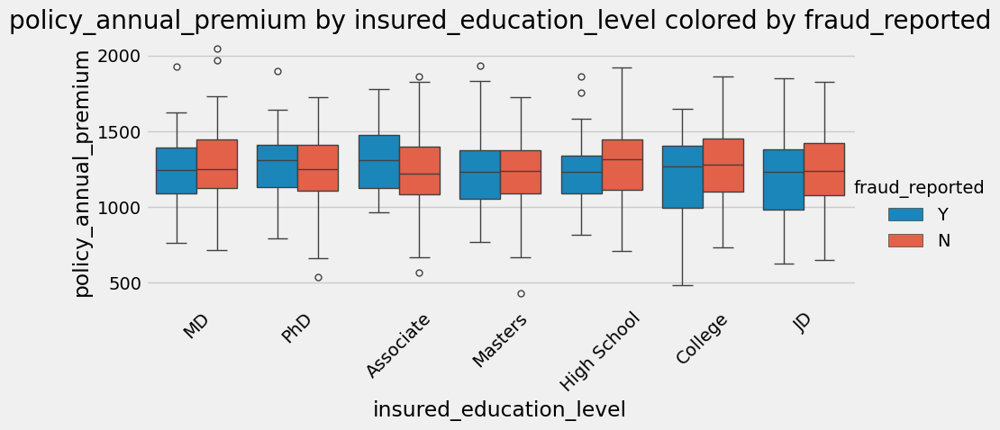

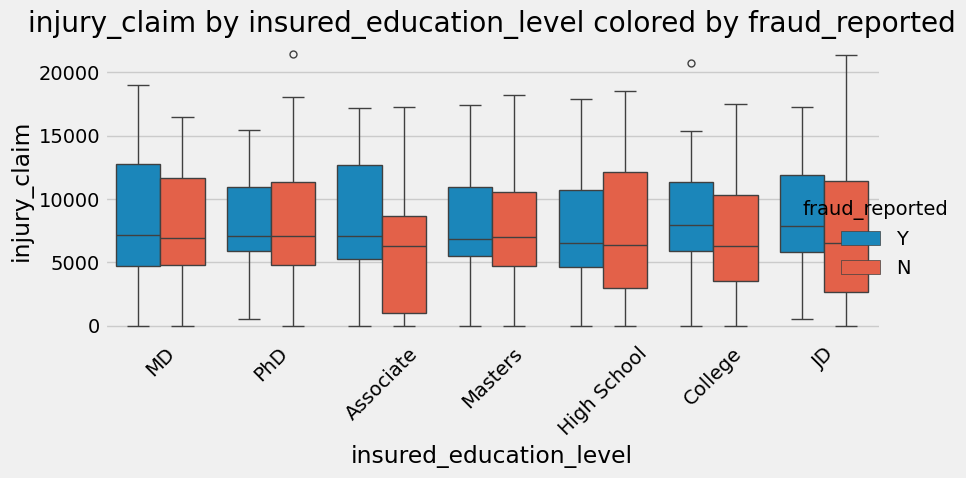

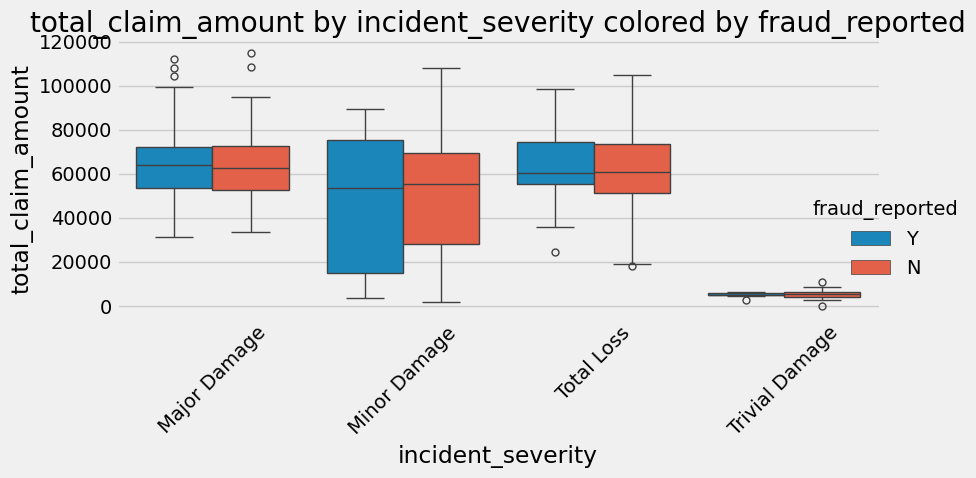

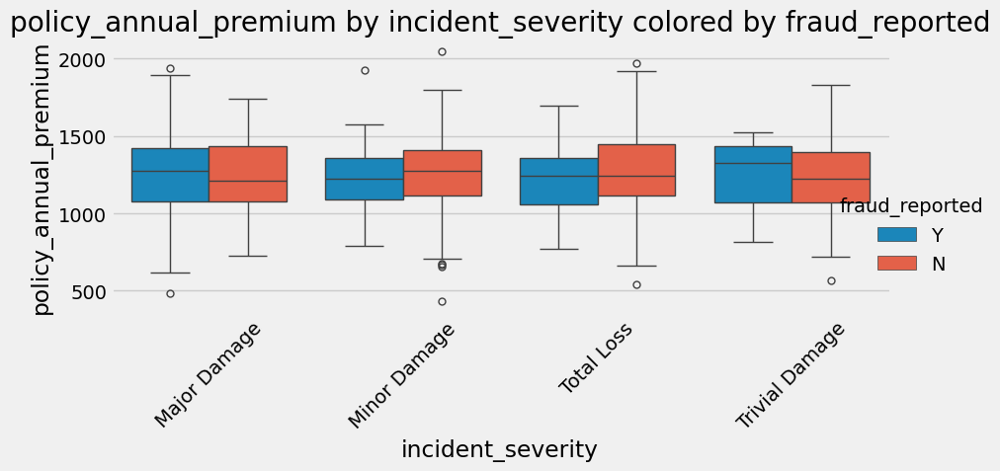

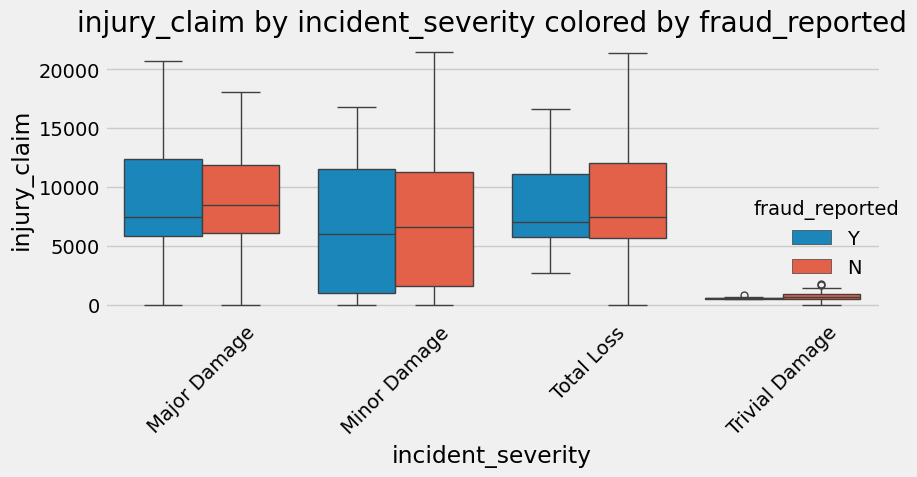

In [ ]:
sns.pairplot(df[numerical_cols + [target]], hue=target, palette='husl', corner=True)
plt.suptitle("Pairplot - All Numerical Features with Target", y=1.02)
plt.show()

# 3. Catplot: Categorical Feature vs Numerical Feature vs Target
# Picking 3 common combinations to avoid overplotting
cat_features = ['incident_type', 'insured_education_level', 'incident_severity']
num_features = ['total_claim_amount', 'policy_annual_premium', 'injury_claim']

for cat in cat_features:
    for num in num_features:
        g = sns.catplot(data=df, x=cat, y=num, hue=target, kind="box", height=5, aspect=1.5)
        plt.title(f'{num} by {cat} colored by {target}')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

In [ ]:
from sklearn.preprocessing import LabelEncoder

df_enc = df.copy()
label_encoders = {}

for col in categorical_cols:
    le = LabelEncoder()
    df_enc[col] = le.fit_transform(df_enc[col].astype(str))
    label_encoders[col] = le


In [ ]:
input_options = {}
for col in categorical_cols + numerical_cols:
    if col in df.columns:
        input_options[col] = sorted(df[col].dropna().unique().tolist())

with open("input_options.pkl", "wb") as f:
    pickle.dump(input_options, f)

# Save label encoders
with open("label_encoders.pkl", "wb") as f:
    pickle.dump(label_encoders, f)

In [ ]:
all_features = categorical_cols + numerical_cols

if 'fraud_reported' in all_features:
    all_features.remove('fraud_reported')

X = df_enc[all_features]
y = df_enc['fraud_reported']

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)


## SMOTE

In [ ]:
from imblearn.over_sampling import SMOTE

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)


print("Before SMOTE:", y_train.value_counts().to_dict())
print("After SMOTE:", y_train_smote.value_counts().to_dict())

Before SMOTE: {0: 602, 1: 198}
After SMOTE: {0: 602, 1: 602}


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import accuracy_score, f1_score
import matplotlib.pyplot as plt
import numpy as np

model = LogisticRegression(max_iter=1000)
accuracy_scores = []
f1_scores = []
selected_feature_names = []
num_features_list = list(range(1, X_train.shape[1] + 1))

for k in num_features_list:
    rfe = RFE(model, n_features_to_select=k)
    rfe.fit(X_train, y_train)

    X_k_train = rfe.transform(X_train)
    X_k_test = rfe.transform(X_test)

    model.fit(X_k_train, y_train)
    y_pred = model.predict(X_k_test)

    acc = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, pos_label=1)

    accuracy_scores.append(acc)
    f1_scores.append(f1)

    selected = X.columns[rfe.get_support()]
    preview = ", ".join(selected[:2]) + ("..." if len(selected) > 2 else "")
    selected_feature_names.append(preview)


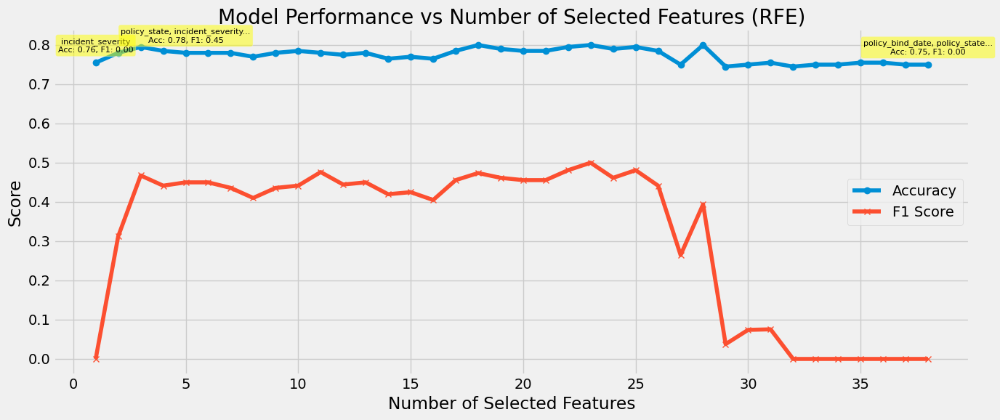

In [ ]:
plt.figure(figsize=(14, 6))
plt.plot(num_features_list, accuracy_scores, label='Accuracy', marker='o')
plt.plot(num_features_list, f1_scores, label='F1 Score', marker='x')
plt.xlabel("Number of Selected Features")
plt.ylabel("Score")
plt.title("Model Performance vs Number of Selected Features (RFE)")
plt.legend()
plt.grid(True)

for i in [0, 4, len(num_features_list) - 1]:
    plt.annotate(
        f"{selected_feature_names[i]}\nAcc: {accuracy_scores[i]:.2f}, F1: {f1_scores[i]:.2f}",
        (num_features_list[i], accuracy_scores[i]),
        textcoords="offset points",
        xytext=(0, 10),
        ha='center',
        fontsize=8,
        bbox=dict(boxstyle="round,pad=0.3", fc="yellow", alpha=0.5)
    )

plt.tight_layout()
plt.show()

In [ ]:
best_k = 23
rfe_final = RFE(LogisticRegression(max_iter=1000), n_features_to_select=best_k)
rfe_final.fit(X_train, y_train)

selected_features = X.columns[rfe_final.get_support()]
print("Selected features:", selected_features.tolist())

# Filter train/test with selected features
X_train_sel = X_train[selected_features]
X_test_sel = X_test[selected_features]

Selected features: ['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_date', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'months_as_customer', 'age', 'incident_hour_of_the_day', 'bodily_injuries', 'witnesses', 'auto_year']


In [ ]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train_sel, y_train)

print("Original y_train distribution:\n", y_train.value_counts())
print("Resampled y_train distribution:\n", y_train_res.value_counts())

Original y_train distribution:
 fraud_reported
0    602
1    198
Name: count, dtype: int64
Resampled y_train distribution:
 fraud_reported
0    602
1    602
Name: count, dtype: int64


# **SCALING**

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train_res)
X_test_scaled = scaler.transform(X_test_sel)

print("Scaled Train Shape:", X_train_scaled.shape)
print("Scaled Test Shape :", X_test_scaled.shape)

Scaled Train Shape: (1204, 23)
Scaled Test Shape : (200, 23)


## Model Building

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, ConfusionMatrixDisplay
)
import matplotlib.pyplot as plt
import seaborn as sns

# Train the model
model = RandomForestClassifier(random_state=42)
model.fit(X_train_scaled, y_train_res)

# Predict
y_pred = model.predict(X_test_scaled)
y_proba = model.predict_proba(X_test_scaled)[:, 1]  # For ROC-AUC

# Evaluation Metrics
print("Evaluation Metrics:")
print(f"Accuracy:  {accuracy_score(y_test, y_pred):.4f}")
print(f"Precision: {precision_score(y_test, y_pred):.4f}")
print(f"Recall:    {recall_score(y_test, y_pred):.4f}")
print(f"F1-Score:  {f1_score(y_test, y_pred):.4f}")

Evaluation Metrics:
Accuracy:  0.7800
Precision: 0.5581
Recall:    0.4898
F1-Score:  0.5217


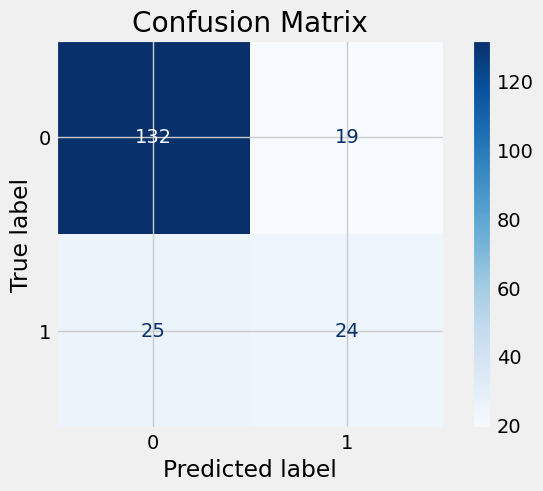

In [ ]:
# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap="Blues")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report

dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train_scaled, y_train_res)

y_pred_dt = dt_model.predict(X_test_scaled)

print("Decision Tree Classification Report:")
print(classification_report(y_test, y_pred_dt, target_names=["Not Fraud", "Fraud"]))

Decision Tree Classification Report:
              precision    recall  f1-score   support

   Not Fraud       0.86      0.85      0.85       151
       Fraud       0.55      0.57      0.56        49

    accuracy                           0.78       200
   macro avg       0.70      0.71      0.71       200
weighted avg       0.78      0.78      0.78       200



In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

rf_model = RandomForestClassifier(random_state=42, n_estimators=100)
rf_model.fit(X_train_scaled, y_train_res)

y_pred_rf = rf_model.predict(X_test_scaled)

print("Random Forest Classification Report:")
print(classification_report(y_test, y_pred_rf, target_names=["Not Fraud", "Fraud"]))

Random Forest Classification Report:
              precision    recall  f1-score   support

   Not Fraud       0.84      0.87      0.86       151
       Fraud       0.56      0.49      0.52        49

    accuracy                           0.78       200
   macro avg       0.70      0.68      0.69       200
weighted avg       0.77      0.78      0.77       200



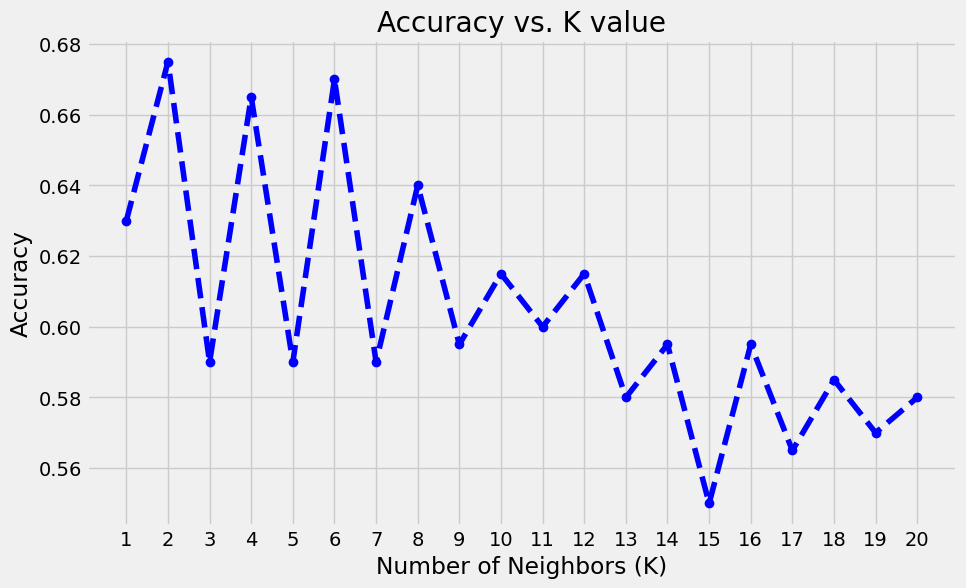

In [ ]:
k_values = range(1, 21)
accuracies = []

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_scaled, y_train_res)
    y_pred_k = knn.predict(X_test_scaled)
    acc = accuracy_score(y_test, y_pred_k)
    accuracies.append(acc)

# Plotting accuracy vs k
plt.figure(figsize=(10, 6))
plt.plot(k_values, accuracies, marker='o', linestyle='dashed', color='blue')
plt.title('Accuracy vs. K value')
plt.xlabel('Number of Neighbors (K)')
plt.ylabel('Accuracy')
plt.xticks(k_values)
plt.grid(True)
plt.show()

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report

knn_model = KNeighborsClassifier(n_neighbors=10)
knn_model.fit(X_train_scaled, y_train_res)

y_pred_knn = knn_model.predict(X_test_scaled)

print("KNN Classification Report:")
print(classification_report(y_test, y_pred_knn, target_names=["Not Fraud", "Fraud"]))

KNN Classification Report:
              precision    recall  f1-score   support

   Not Fraud       0.89      0.56      0.69       151
       Fraud       0.37      0.78      0.50        49

    accuracy                           0.61       200
   macro avg       0.63      0.67      0.59       200
weighted avg       0.76      0.61      0.64       200



In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

lr_model = LogisticRegression(max_iter=1000, random_state=42)
lr_model.fit(X_train_scaled, y_train_res)

y_pred_lr = lr_model.predict(X_test_scaled)

print("Logistic Regression Classification Report:")
print(classification_report(y_test, y_pred_lr, target_names=["Not Fraud", "Fraud"]))

Logistic Regression Classification Report:
              precision    recall  f1-score   support

   Not Fraud       0.86      0.79      0.83       151
       Fraud       0.49      0.61      0.55        49

    accuracy                           0.75       200
   macro avg       0.68      0.70      0.69       200
weighted avg       0.77      0.75      0.76       200



In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report

nb_model = GaussianNB()
nb_model.fit(X_train_scaled, y_train_res)
y_pred_nb = nb_model.predict(X_test_scaled)

print("Naive Bayes Classification Report:")
print(classification_report(y_test, y_pred_nb, target_names=["Not Fraud", "Fraud"]))


Naive Bayes Classification Report:
              precision    recall  f1-score   support

   Not Fraud       0.86      0.81      0.84       151
       Fraud       0.51      0.59      0.55        49

    accuracy                           0.76       200
   macro avg       0.68      0.70      0.69       200
weighted avg       0.77      0.76      0.77       200



In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report

svm_model = SVC(kernel='rbf', probability=True, random_state=42)
svm_model.fit(X_train_scaled, y_train_res)
y_pred_svm = svm_model.predict(X_test_scaled)

print("SVM Classification Report:")
print(classification_report(y_test, y_pred_svm, target_names=["Not Fraud", "Fraud"]))

SVM Classification Report:
              precision    recall  f1-score   support

   Not Fraud       0.86      0.89      0.87       151
       Fraud       0.61      0.55      0.58        49

    accuracy                           0.81       200
   macro avg       0.74      0.72      0.73       200
weighted avg       0.80      0.81      0.80       200



**Best Overall (Balance of Metrics):**
*   Random Forest (highest accuracy with decent fraud precision & recall)
*   Decision Tree is close and interpretable.



**Best for Detecting Fraud (Recall):**
*   KNN (recall = 0.76) but trade-off is poor precision & accuracy.



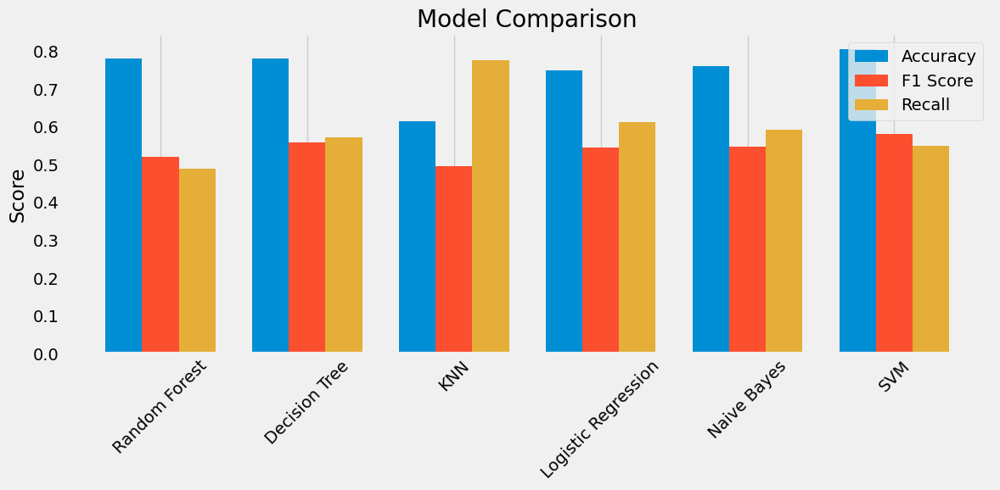

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

models = {
    "Random Forest": rf_model,
    "Decision Tree": dt_model,
    "KNN": knn_model,
    "Logistic Regression": lr_model,
    "Naive Bayes": nb_model,
    "SVM": svm_model
}

metrics = {"Accuracy": [], "F1 Score": [], "Recall": []}
model_names = []

for name, clf in models.items():
    y_pred = clf.predict(X_test_scaled)
    metrics["Accuracy"].append(accuracy_score(y_test, y_pred))
    metrics["F1 Score"].append(f1_score(y_test, y_pred))
    metrics["Recall"].append(recall_score(y_test, y_pred))
    model_names.append(name)

# Plot
x = np.arange(len(model_names))
width = 0.25

plt.figure(figsize=(12, 6))
plt.bar(x - width, metrics["Accuracy"], width, label='Accuracy')
plt.bar(x, metrics["F1 Score"], width, label='F1 Score')
plt.bar(x + width, metrics["Recall"], width, label='Recall')
plt.xticks(x, model_names, rotation=45)
plt.title("Model Comparison")
plt.ylabel("Score")
plt.legend()
plt.tight_layout()
plt.grid(axis="y")
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score

def comparison(X_test, y_test):
    print("logistic Regression:", 100 * accuracy_score(y_test, y_pred_lr))
    print("-" * 50)

    print("KNN:", 100 * accuracy_score(y_test, y_pred_knn))
    print("-" * 50)

    print("SVM:", 100 * accuracy_score(y_test, y_pred_svm))
    print("-" * 50)

    print("Naive-Bayes:", 100 * accuracy_score(y_test, y_pred_nb))
    print("-" * 50)

    print("Decision Tree:", 100 * accuracy_score(y_test, y_pred_dt))
    print("-" * 50)

    print("Random Forest:", 100 * accuracy_score(y_test, y_pred_rf))
    print("-" * 50)


comparison(X_test_scaled, y_test)

logistic Regression: 75.0
--------------------------------------------------
KNN: 61.5
--------------------------------------------------
SVM: 80.5
--------------------------------------------------
Naive-Bayes: 76.0
--------------------------------------------------
Decision Tree: 78.0
--------------------------------------------------
Random Forest: 78.0
--------------------------------------------------


In [ ]:
from sklearn.model_selection import cross_val_score
import numpy as np

# Define all models
models = {
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "KNN": KNeighborsClassifier(n_neighbors=10),
    "Logistic Regression": LogisticRegression(max_iter=1000, random_state=42),
    "Naive Bayes": GaussianNB(),
    "SVM": SVC(kernel='rbf', probability=True, random_state=42)
}

for name, model in models.items():
    scores = cross_val_score(model, X_train_scaled, y_train_res, cv=5, scoring='accuracy')
    print(f"{name} Accuracy: {np.mean(scores):.4f}")


Decision Tree Accuracy: 0.8190
Random Forest Accuracy: 0.8605
KNN Accuracy: 0.7301
Logistic Regression Accuracy: 0.7750
Naive Bayes Accuracy: 0.7742
SVM Accuracy: 0.8157


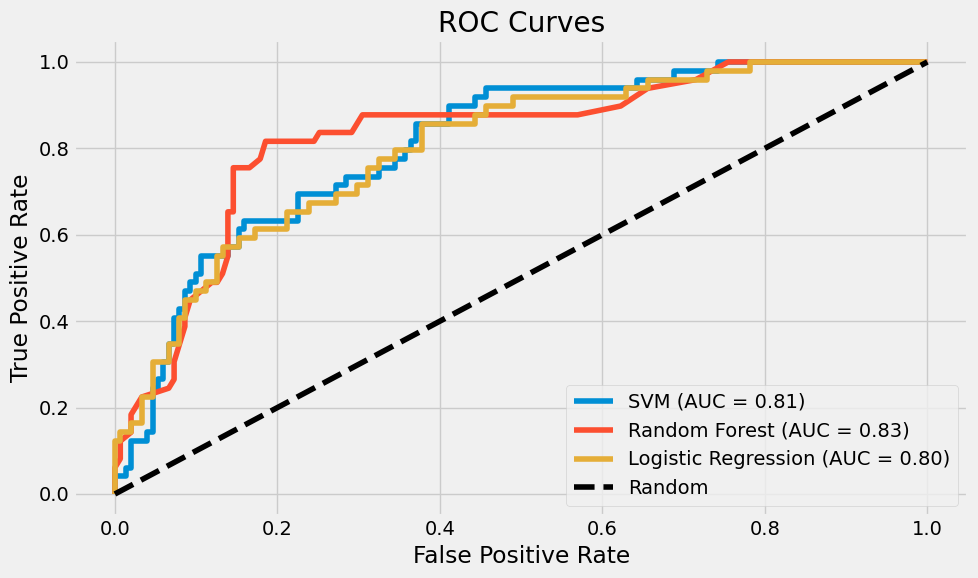

In [ ]:
from sklearn.metrics import roc_curve, auc

models = {
    'SVM': svm_model,
    'Random Forest': rf_model,
    'Logistic Regression': lr_model
}

plt.figure(figsize=(10, 6))

for name, clf in models.items():
    y_prob = clf.predict_proba(X_test_scaled)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    auc_score = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{name} (AUC = {auc_score:.2f})")

plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
import pickle

# Save the trained model
with open("fraud_rf_model.pkl", "wb") as f:
    pickle.dump(rf_model, f)

# Optionally also save the scaler used for preprocessing
with open("scaler.pkl", "wb") as f:
    pickle.dump(scaler, f)

# Save selected feature names
with open("selected_features.pkl", "wb") as f:
    pickle.dump(selected_features, f)
